# Impacto de los subsidios de Sercotec en micro y pequeñas empresas: una mirada territorial.

In [109]:
# Load libraries
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
from matplotlib_scalebar.scalebar import ScaleBar
from pylab import rcParams
import matplotlib as mpl
#mpl.rcParams['figure.dpi'] = 300

import seaborn as sns
sns.set_style("darkgrid")

import plotly.express as px
import plotly.graph_objects as go

import geopandas as gpd

import contextily as cx

import libpysal
from libpysal  import weights
from libpysal.weights import Queen

import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster, plot_local_autocorrelation
from splot.libpysal import plot_spatial_weights
from splot.mapping import vba_choropleth

import inequality
from inequality.gini import Gini_Spatial

import statsmodels.api as sm
import statsmodels.formula.api as smf

from mgwr.gwr import GWR, MGWR, GWRResults
from mgwr.sel_bw import Sel_BW
from mgwr.utils import shift_colormap, truncate_colormap

# To export GWR Table
from scipy import stats
from IPython.display import HTML

import seaborn
from splot import esda as esdaplot

import warnings
warnings.filterwarnings('ignore') 

## Highlights

- Dada la mayor granularidad de datos disponibles, hoy es posible desagregar análisis y entender de mejor forma fenómenos socio-ecnómicos.

- El presente trabajo entrega una mirada sobre:
    - Los patrones de clusterización territorial tomando como referencia datos de ventas de micro y pequeñas empresas (mipes) y subsidios Sercotec agregados a nivel de ciudad, y
    - Los efectos de los subsidios de Sercotec en las ventas de mipes, poniendo especial énfasis en la heterogeneidad de los efectos en las distintas ciudades del país usando una regresión ponderada geográficamente (GWR).

- Los principales resultaods son los siguientes:
    - Se observan patrones de clusterización a nivel global, lo que indica que existe relación territorial a nivel de ciudad. 
    - Los patrones de clusterización local son más bien débiles, sin embargo, existen observaciones estadísticamente significativas.
    - A nivel país, se observa un efecto positivo de los subsidios de Sercotec de 0,184 puntos dado el aumento de 1 unidad de Subsidios, medidos en logaritmo natural.
    - A nivel local, los resultados sugieren que la relación entre los subsidios otorgados por Sercotec y las ventas de las micro y pequeñas empresas es diferente en diferentes lugares de Chile, y que el análisis GWR brinda una mejor explicación de la heterogeneidad espacial de esta relación en comparación con el análisis de regresión global. 
    - Para refinar los resultados de la investigación, se recomienda aplicar los modelos usando datos de performance económica de empresas que efectivamente hayan sido beneficiadas por Sercotec. Esto, permitirá tener una visión muchísimo más detallada y con una visión de muestra.

Si bien este trabajo muestra resultados, se aplicar los modelos utilizando datos de aquellas empresas que fueron efectivamente beneficiadas por Sercotec. Con lo anterior, es posible realizar un análisis por croseccional y, para controlar por variables omitidas, se recomienda seguir activamente recopilando datos de performance económica de dichas empresas en orden de implementar modelos econonétricos basaos en datos de panel o series de tiempo. 

## 1. Introducción

2021 registró más de 1 millón de empresas en Chile y la gran mayoría de ellas son micro y pequeñas empresas. 

En Chile, luego de un 2019 marcado por fuertes movilizaciones sociales y un 2020 que marcó el punto más álgido de la pandemia, el 2021 se vislumbró como el año para retomar la senda del crecimiento y el apoyo de organismos públicos como el Servicio de Cooperación Técnica, Sercotec, se consideró como fundamental para las empresas más pequeñas. 

El objetivo de este estudio es entregar comprensiones sobre la relación de los subsidios otorgados por Sercotec y las ventas de micro y pequeñas empresas en Chile desagregado a nivel de ciudad usando dos métodos:
         - **Análisis exploratorio de datos espaciales (ESDA)**, que muestra los patrones de relación territorial de ambas variables, ventas y subsidios, por separado.
         - **Regresión ponderada geográficamente**, que muestra la heterogeneidad de los efectos de los subsidios en mipes en las distintas ciudades del país.

Se usaron los siguientes datos y fuentes:
         - **Nivel de ventas de micro y pequeñas empresas**, agregadas a nivel de ciudad, 2021, Estadísticas de Empresas, SII.
         - **Nivel de subsidios Sercotec**, agregados a nivel de ciudad por parte de las gerencias de Desarrollo Empresarial y Desarrollo Asociativo 2021, Sercotec.
         - **Información geográfica**, que permitió organizar los mapas y que se extrajo desde la web de datos abiertos **https://geo.aiddata.org/**

Finalmente, el data set construido puede encontrarse en el siguiente repositorio: **https://github.com/Manulobu/Spatial-MSE-RegionalDevelopment**

## 2. Resumen de datos utilizados

Tabla - Resumen de dataset construido

In [2]:
data = '/work/Spatial-MSE-RegionalDevelopment/Geoeconomic Mipe Sercotec 2021.geojson'
gdf = gpd.read_file(data)
gdf.head()

,year,adm1,adm3,adm1-adm3,asdf_id,shapeID,qfirms,sales,labour,sercotec,bdd,add,rank_qfirms,rank_sales,rank_labour,rank_sercotec,rank_bdd,rank_add,COORD_X,COORD_Y,geometry
0,2021,OHiggins,Marchigue,OHig-Marc,0,CHL-ADM3-31136180B50538386,620,24.510365,1856,18.811602,18.811602,0.0,243,299,241,162,150,173,-71.681868,-34.359057,"MULTIPOLYGON (((-71.79209 -34.24074, -71.79337..."
1,2021,OHiggins,Codegua,OHig-Code,1,CHL-ADM3-31136180B54262267,640,24.706683,3328,16.461916,16.461916,0.0,240,266,180,335,332,335,-70.498716,-34.039308,"MULTIPOLYGON (((-70.32768 -34.01033, -70.32604..."
2,2021,OHiggins,Coinco,OHig-Coin,2,CHL-ADM3-31136180B4849223,446,24.069714,1555,17.659486,17.659486,0.0,273,329,262,285,278,286,-70.970391,-34.283279,"MULTIPOLYGON (((-70.87938 -34.24235, -70.88329..."
3,2021,OHiggins,Coltauco,OHig-Colt,3,CHL-ADM3-31136180B94556136,1097,24.958164,6992,17.537814,17.537814,0.0,178,235,116,290,283,291,-71.086185,-34.278195,"MULTIPOLYGON (((-70.97971 -34.25526, -70.98143..."
4,2021,"Araucania, La",Cholchol,Arau-Chol,4,CHL-ADM3-31136180B14840627,289,27.769984,1360,16.537081,16.537081,0.0,301,47,271,332,329,332,-72.889482,-38.574726,"MULTIPOLYGON (((-72.76592 -38.58428, -72.76879..."


Tabla - Descripción de variables contenidas en el dataset

In [3]:
dataDefinitions = pd.read_csv('/work/Spatial-MSE-RegionalDevelopment/Table 1 - Descripción de variables.csv')
dataDefinitions

,Variable,Description
0,year,"ano de analisis, 2021."
1,adm1,Nivel de division administrativa 1. En el caso...
2,adm3,Nivel de divisinon administrativa 3. En el cas...
3,adm1-adm3,Una abreviacion de la ciudad y la region a la ...
4,asdf_id,Codigo provisto por GeoQuery para individualiz...
5,shapeID,Codigo para individualizar poligonos geograficos.
6,qfirms,Numero de micro y pequenas (mipes) empresas re...
7,sales,Ventas anuales de mipes por ciudad expresadas ...
8,labour,Numero de personas empleadas por mipes por ciu...
9,sercotec,Suma de los subsidios entregados por ciudad a ...


Tabla - Resumen de estadística de empresas, 2021

In [4]:
generalFigures = pd.read_csv('/work/Spatial-MSE-RegionalDevelopment/Table 2 - MSME General Figures.csv', encoding='ISO-8859-1')
generalFigures

,Segment,Firms,Sales,Labour,Avg labour
0,Micro,823571,"$620,653,074",1334083,1.62
1,Small,243324,"$4,317,222,653",3011668,12.38
2,Medium,37517,"$8,180,138,214",1911731,50.96
3,Large,18176,"$32,516,541,636",6169391,339.43
4,Total,1122588,"$45,634,555,576",12426873,NaN


La tabla muestra datos que permiten describir la estructura del tejido empresarial de Chile en términos generales: 

-	En Chile, el número total de empresas con ventas registradas en 2021 fue de 1,122,588.
-	Del total de empresas con ventas, el 98,4% son micro, pequeñas o medianas empresas. 73.4% son microempresas; 21,68% son pequeñas, 3,34% son medianas y sólo un 1.62% son grandes empresas.
-	En contraste, el segmento MSME concentró sólo el 28.8% de las ventas registradas, versus un 71.3% de grandes empresas en 2021.
-	En términos de empleo, el sector mipyme entrega el 50.4% del empleo. Es importante indicar que las microempresas emplean en promedio a 1.62 personas. Es decir, considerando la gran proporción de microempresas, el autoempleo es un fenómeno relevante que debería comprenderse con mayor profundidad.

Tabla - Resumen subsidios Sercotec, 2016 - 2022

In [5]:
sercotecFigures = pd.read_csv('/work/Spatial-MSE-RegionalDevelopment/Table 3 - Sercotec 2016 a 2022.csv')
sercotecFigures

,Year,Division,Granted Subsidies (CLP million),Users
0,2016,Desarrollo Asociativo,"$5,787",635
1,2017,Desarrollo Asociativo,"$8,099",1323
2,2018,Desarrollo Asociativo,"$7,073",756
3,2019,Desarrollo Asociativo,"$7,548",906
4,2020,Desarrollo Asociativo,"$12,885",1959
5,2021,Desarrollo Asociativo,"$15,491",1772
6,2022,Desarrollo Asociativo,"$18,004",872
7,2016,Desarrollo Empresarial,"$15,700",12347
8,2017,Desarrollo Empresarial,"$15,951",11971
9,2018,Desarrollo Empresarial,"$14,340",11895


Como. sepuede observar en la tabla, 2021 representa un año fundamental para ambas divisiones, ya que fue el año que más concentró recursos y atención de usuarios. En total, un 30% de los recursos entregados desde 2016 y un 26% del total de usuarios atendidos se concentra en 2021.

In [6]:
variables = dataDefinitions['Variable']

In [7]:
INDICATOR1 = 'sales'
INDICATOR2 = 'sercotec'

Resumen de estadísticos

In [8]:
gdf[[INDICATOR1, INDICATOR2]].describe().round(2)

,sales,sercotec
count,345.00,345.00
mean,25.98,18.78
std,1.44,1.30
min,22.08,15.07
25%,24.77,17.94
50%,25.75,18.70
75%,27.65,19.63
max,29.28,22.11


## 3. Distribución territorial por región y ciudad

Ventas - Gráficas interactivas

In [9]:
px.strip(gdf, x = INDICATOR1, y = 'adm1', color = 'adm1', hover_name= 'adm3', 
        hover_data= ['qfirms','rank_sales','labour','sercotec'],
        labels=dict(sales = 'Ventas anuales (ln)',
                    rank_sales = 'Ranking de ciudad de acuerdo a ventas de mipes',
                    adm3 = 'Ciudad',
                    adm1 = 'Region',
                    qfirms = 'Cantidad de empresas',
                    labour = 'Cantidad de trabajadores/as empleados por mipes',
                    sercotec = 'Subsidios entregados por sercotec (ln)')
        )

In [10]:
px.box(gdf, x = INDICATOR1, y = 'adm1', color = 'adm1', hover_name= 'adm3', 
        hover_data= ['qfirms','rank_sales','labour','sercotec'],
        labels=dict(sales = 'Ventas anuales (ln)',
                    rank_sales = 'Ranking de ciudad de acuerdo a ventas de mipes',
                    adm3 = 'Ciudad',
                    adm1 = 'Region',
                    qfirms = 'Cantidad de empresas',
                    labour = 'Cantidad de trabajadores/as empleados por mipes',
                    sercotec = 'Subsidios entregados por sercotec (ln)')
        )

Subsidios - Gráficas interactivas

In [11]:
px.strip(gdf, x = INDICATOR2, y = 'adm1', color = 'adm1', hover_name= 'adm3', 
        hover_data= ['qfirms','rank_sercotec','labour','bdd','add'],
        labels=dict(sales = 'Ventas anuales (ln)',
                    rank_sercotec = 'Ranking de ciudad de acuerdo a ventas de mipes',
                    adm3 = 'Ciudad',
                    adm1 = 'Region',
                    qfirms = 'Cantidad de empresas',
                    labour = 'Cantidad de trabajadores/as empleados por mipes',
                    bdd = 'Subsidios entregados por desarrollo empresarial (ln)',
                    add = 'Subsidios entregados por desarrollo asociativo (ln)')
        )

In [12]:
px.box(gdf, x = INDICATOR2, y = 'adm1', color = 'adm1', hover_name= 'adm3', 
        hover_data= ['qfirms','rank_sercotec','labour','bdd','add'],
        labels=dict(sales = 'Ventas anuales (ln)',
                    rank_sercotec = 'Ranking de ciudad de acuerdo a ventas de mipes',
                    adm3 = 'Ciudad',
                    adm1 = 'Region',
                    qfirms = 'Cantidad de empresas',
                    labour = 'Cantidad de trabajadores/as empleados por mipes',
                    bdd = 'Subsidios entregados por desarrollo empresarial (ln)',
                    add = 'Subsidios entregados por desarrollo asociativo (ln)')
        )

## 4. Análisis  Exploratorio de Datos Espaciales

### 4.1. Patrones de clusterización territorial global

A través del uso del análisis exploratorio de datos espaciales (ESDA), este trabajo examina el comportamiento de dos variables: las ventas de las pequeñas y medianas empresas y el monto total de los subsidios otorgados por Sercotec a este segmento específico. Lo anterior, para descubrir patrones, relaciones y tendencias territoriales que no son inmediatamente evidentes al analizar datos a nivel país o a nivel de firma.

Figura - Mapa de clusterización global - Ventas y Subsidios

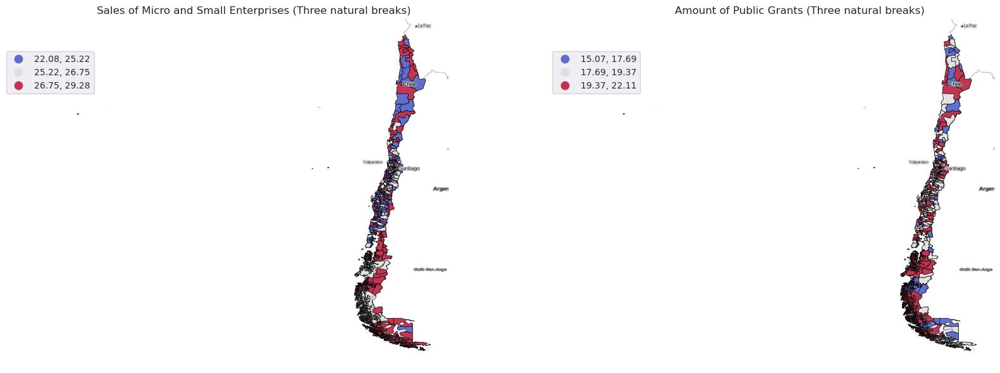

In [13]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(18, 6))

# Plot the first map on the left axis
gdf.plot(column=INDICATOR1, 
         scheme='FisherJenks', 
         k=3,
         cmap='coolwarm',
         edgecolor='k', 
         linewidth=0.5, 
         alpha=0.8,  
         legend=True, 
         ax=ax[0], 
         legend_kwds={'bbox_to_anchor':(0.10, 0.92)})
cx.add_basemap(ax[0], crs=gdf.crs.to_string(), source = cx.providers.Stamen.TonerHybrid, attribution=False)
ax[0].set_title('Sales of Micro and Small Enterprises (Three natural breaks)')
ax[0].axis("off")

# Plot the second map on the right axis
gdf.plot(column=INDICATOR2, 
         scheme='FisherJenks', 
         k=3,
         cmap='coolwarm',
         edgecolor='k', 
         linewidth=0.5, 
         alpha=0.8,  
         legend=True, 
         ax=ax[1], 
         legend_kwds={'bbox_to_anchor':(0.10, 0.92)})
cx.add_basemap(ax[1], crs=gdf.crs.to_string(), source = cx.providers.Stamen.TonerHybrid, attribution=False)
ax[1].set_title('Amount of Public Grants (Three natural breaks)')
ax[1].axis("off")

plt.tight_layout()
# plt.savefig('myMap.png',dpi=150, bbox_inches='tight')
plt.show()


Los mapas arriba presentan una clasificación espacial inicial, utilizando el método de Fisher Jenks con tres segmentaciones, que muestra en qué ciudades de Chile los valores de ambas variables – ventas de mipes y los subsidios que otorga Sercotec a estas empresas – muestran niveles bajos, medios y altos, con colores rojo, gris y azul, respectivamente.

Cabe señalar que, dado que Chile es un país con una geografía particular (territorio continental largo y delgado, con islas distantes), la visualización puede ser un problema para algunos lectores.

El mapa de la izquierda muestra la distribución espacial de las ventas anuales de las micro y pequeñas empresas. Distribuye valores en segmentos con valores bajos, ln 20.08 a ln 26.15, un grupo medio que va de ln 26.15 a ln 27.52 y un grupo alto con valores entre ln 27.52 a ln 30.11. El mapa de la derecha, muestra la distribución de los segmentos territoriales para los subsidios que otorga Sercotec a las micro y pequeñas empresas. El grupo de ciudades en que los valores de subsidios son bajos va desde ln 15.07 a ln 17.69; el grupo medio, desde ln 17,69 a ln 19,37; y el grupo alto desde ln 19.37 a ln 22.11. Todos los valores están expresados en logaritmo natural de pesos chilenos.


In [14]:
#W = weights.Queen.from_dataframe(gdf)
W = weights.KNN.from_dataframe(gdf, k=4)
W.transform = 'r'
#plot_spatial_weights(W, gdf);
#print(W.weights)

In [15]:
myLIST1 = ['asdf_id', 'adm3', 'adm1', 'adm1-adm3', 'rank_sales', INDICATOR1]
df_MORAN1 = gdf[myLIST1]
df_MORAN1["WxINDICATOR1"] = weights.lag_spatial(W, df_MORAN1.iloc[: , -1])

In [16]:
myLIST2 = ['asdf_id', 'adm3', 'adm1', 'adm1-adm3', 'rank_sercotec', INDICATOR2]
df_MORAN2 = gdf[myLIST2]
df_MORAN2["WxINDICATOR2"] = weights.lag_spatial(W, df_MORAN2.iloc[: , -1])

En términos de autocorrelación global, los gráficos de dispersión para cada variable que se muestran a continuación muestran una pendiente positiva con tendencia a la elasticidad. La elasticidad de la línea de tendencia sugiere la presencia relativa de autocorrelación espacial, lo que significa que las ciudades con valores similares en cada variable tienden a tener vecinos con valores similares. Lo anterior sugiere procesos que no responden a la mera aleatoriedad y denotan una relación territorial.

Figura - Dispersión de clusterización territorial - Ventas

In [17]:
px.scatter(
    df_MORAN1,
    x= INDICATOR1,
    y= "WxINDICATOR1",
    hover_name= "adm3",
    hover_data = ['adm1', 'rank_sales', INDICATOR1, 'WxINDICATOR1'],
    trendline =  "ols",
    marginal_x = "box",
    marginal_y = "box",
    labels=dict(sales = 'Nivel de venta mipe por ciudad (ln)',
                rank_sales = 'Ranking de ciudad de acuerdo a ventas mipe',
                WxINDICATOR1 = 'Ventas de mipes en ciudades vecinas',
                adm3 = 'Ciudad',
                adm1 = 'Región')
    )

Figura - Dispersión de clusterización territorial - Subsidios

In [18]:
px.scatter(
    df_MORAN2,
    x= INDICATOR2,
    y= "WxINDICATOR2",
    hover_name= "adm3",
    hover_data = ['adm1', 'rank_sercotec', INDICATOR2, 'WxINDICATOR2'],
    trendline =  "ols",
    marginal_x = "box",
    marginal_y = "box",
    labels=dict(sercotec = 'Subsidios Sercotec por ciudad',
                rank_sercotec = 'Ranking de ciudad de acuerdo a subsidios Sercotec',
                WxINDICATOR2 = 'Subsidios sercotec en ciudades vecinas',
                adm3 = 'Ciudad',
                adm1 = 'Región')
    )

In [19]:
myLIST1 = ['asdf_id', 'adm3', 'adm1', 'adm1-adm3', 'rank_sales', INDICATOR1]
df_MORAN1 = gdf[myLIST1]
df_MORAN1["WxINDICATOR1"] = weights.lag_spatial(W, df_MORAN1.iloc[: , -1])

In [20]:
globalMoran = Moran(gdf[INDICATOR1], W)
MoranI = globalMoran.I
MoranI = "{:.2f}".format(MoranI)
localMoran = Moran_Local(gdf[INDICATOR1], W, permutations = 999, seed=12345)

Los resultados del indicador Moran´s I para ambas variables apoyan aún más esta conclusión. Para las ventas de micro y pequeñas empresas, el valor es de alrededor de 0,12, con un valor p-sim de 0,002, lo que sugiere una fuerte autocorrelación espacial global. Para los subsidios de Sercotec, el valor de Moran´s I es 0,098 con un valor p-sim de 0,003, lo que también indica la presencia de autocorrelación espacial.

En general, estos resultados sugieren que existe un patrón espacial tanto para las ventas de micro y pequeñas empresas como para los subsidios de Sercotec en Chile, con ciudades con valores altos que tienden a agruparse.

Moran's I para - Ventas

In [21]:
W.transform = "R"
moran = esda.moran.Moran(gdf["sales"], W)
moran.I

0.1195078203351074

P-sim para  - Ventas

In [22]:
moran.p_sim

0.002

For Sercotec subsidies, the calculated Moran's I statistic is 0.098 with a p-value of 0.04, indicating weak to moderate global spatial autocorrelation.

Moran's I para - Subsidios

In [23]:
W.transform = "R"
moran = esda.moran.Moran(gdf["sercotec"], W)
moran.I

0.0982370155216512

P-sim para - Subsidios

In [24]:
moran.p_sim

0.005

### 4.2. Patrones de autocorrelación espacial local

Para descubrir la autocorrelación espacial local, se utilizó el estadístico Local Moran´s I. La idea central de este indicador es identificar los casos en los que el valor de una observación y el promedio de su entorno es más similar o diferente, permitiendo identificar clústers de territorios de acuerdo al nivel de intensidad con que se relacionan: Alto-Alto (HH) y Bajo-Bajo (LL) o Alto-Bajo (HL) y Bajo-Alto (LH), respectivamente.

La serie de mapas mostrados a continuación es útil para comprender la información que se deriva de este indicador. El mapa de la esquina superior izquierda detalla si la autocorrelación espacial local de las micro y pequeñas empresas es positiva (HH, LL) o negativa (HL, LH), sin mostrar un patrón especialmente marcado. Además, la presencia de valores alrededor de 0 indica una relativamente baja significancia estadística.

In [65]:
lisa = esda.moran.Moran_Local(gdf["sales"], W)

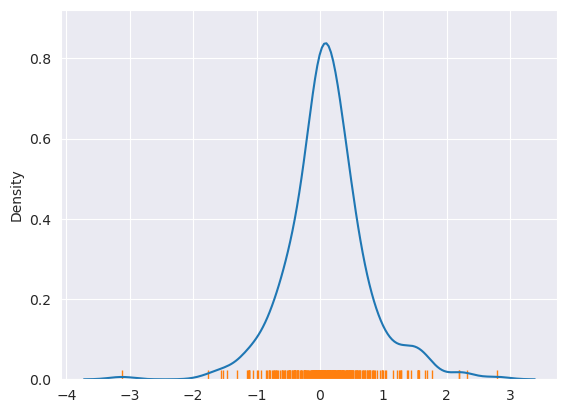

In [66]:
# Draw KDE line
ax = seaborn.kdeplot(lisa.Is)
# Add one small bar (rug) for each observation
# along horizontal axis
seaborn.rugplot(lisa.Is, ax=ax);

Figura - Patrones de clusterización local - Ventas

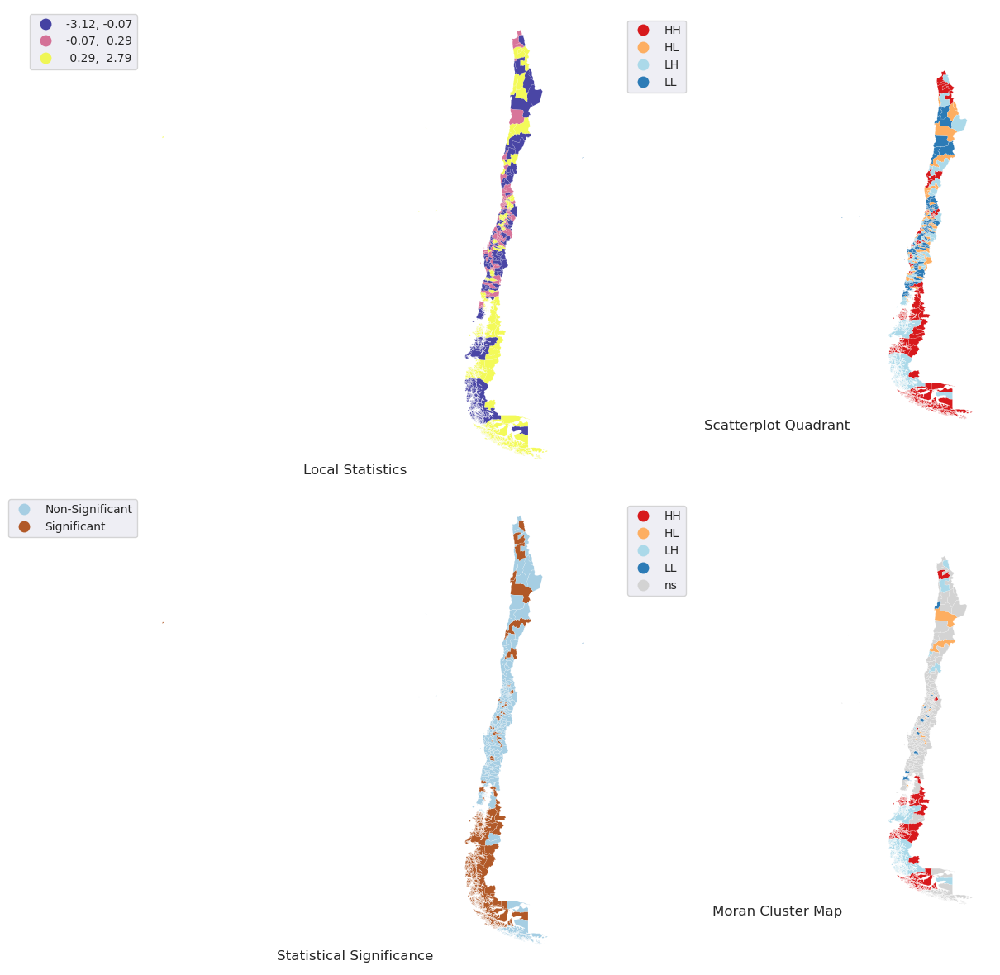

In [67]:
# Set up figure and axes
f, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))
# Make the axes accessible with single indexing
axs = axs.flatten()

# Subplot 1 #
# Choropleth of local statistics
# Grab first axis in the figure
ax = axs[0]
# Assign new column with local statistics on-the-fly
im = gdf.assign(
    Is=lisa.Is
    # Plot choropleth of local statistics
).plot(
    column="Is",
    cmap="plasma",
    scheme="quantiles",
    k=3,
    edgecolor="white",
    linewidth=0.1,
    alpha=0.75,
    legend=True,
    ax=ax,
)

legend = im.get_legend()
legend.set_bbox_to_anchor((0.0, 1.0))

# Subplot 2 #
# Quadrant categories
# Grab second axis of local statistics
ax = axs[1]
# Plot Quandrant colors (note to ensure all polygons are assigned a
# quadrant, we "trick" the function by setting significance level to
# 1 so all observations are treated as "significant" and thus assigned
# a quadrant color
esdaplot.lisa_cluster(lisa, gdf, p=1, ax=ax)
# Get the legend object
legend = ax.get_legend()
# Set the position of the legend
legend.set_bbox_to_anchor((0.3,1.1))

# Subplot 3 #
# Significance map
# Grab third axis of local statistics
ax = axs[2]
#
# Find out significant observations
labels = pd.Series(
    1 * (lisa.p_sim < 0.05),  # Assign 1 if significant, 0 otherwise
    index=gdf.index  # Use the index in the original data
    # Recode 1 to "Significant and 0 to "Non-significant"
).map({1: "Significant", 0: "Non-Significant"})
# Assign labels to `gdf` on the fly
im2 = gdf.assign(
    cl=labels
    # Plot choropleth of (non-)significant areas
).plot(
    column="cl",
    categorical=True,
    k=2,
    cmap="Paired",
    linewidth=0.1,
    edgecolor="white",
    legend=True,
    ax=ax,
)

legend = im2.get_legend()
legend.set_bbox_to_anchor((0.0, 1.0))

# Subplot 4 #
# Cluster map
# Grab second axis of local statistics
ax = axs[3]
# Plot Quandrant colors In this case, we use a 5% significance
# level to select polygons as part of statistically significant
# clusters
esdaplot.lisa_cluster(lisa, gdf, p=0.05, ax=ax)
# Get the legend object
legend = ax.get_legend()
# Set the position of the legend
legend.set_bbox_to_anchor((0.3,1.1))


# Figure styling #
# Set title to each subplot
for i, ax in enumerate(axs.flatten()):
    ax.set_axis_off()
    ax.set_title(
        [
            "Local Statistics",
            "Scatterplot Quadrant",
            "Statistical Significance",
            "Moran Cluster Map",
        ][i],
        y=0,
    )
# Tight layout to minimise in-betwee white space
f.tight_layout()

# Display the figure
plt.show()

In [68]:
lisa.q[:10]

array([3, 2, 3, 3, 4, 2, 3, 2, 3, 3])

El mapa superior derecho permite distinguir entre los diferentes casos. La relación entre estos dos mapas se puede resumir en la siguiente tabla. El valor 1 representa el número de observaciones en el cuadrante HH; 2, los del cuadrante LH, 3 del cuadrante LL y 4; en el cuadrante NS:

In [69]:
counts = pd.value_counts(lisa.q)
counts

3    117
1     92
2     70
4     66
dtype: int64

Como se observa en la tabla, se aprecia un fuerte predominio de clusterización en el cuadrante LL a nivel local para la variable ventas – 117 observaciones –, seguido por 92 observaciones en el cuadrante HH.

Por otro lado, los valores estadísticamente significativos de esta variable se muestran en los gráficos inferiores. Usando un umbral del 5%, el mapa de abajo a la izquierda muestra un patrón claro de baja significancia estadística para los valores de esta variable, sin embargo, todavía es posible observar una seie de territorios relacionados significativamente. La siguiente tabla muestra la frecuencia de estos valores:

In [70]:
# Assign pseudo P-values to `db`
gdf["p-sim"] = lisa.p_sim
# `1` if significant (at 5% confidence level), `0` otherwise
sig = 1 * (lisa.p_sim < 0.05)
# Assign significance flag to `db`
gdf["sig"] = sig
# Print top of the table to inspect
gdf[["sig", "p-sim"]].head()

,sig,p-sim
0,0,0.170
1,0,0.436
2,0,0.067
3,1,0.026
4,0,0.130


In [71]:
# Print bottom of the table to inspect
gdf[["sig", "p-sim"]].tail()

,sig,p-sim
340,0,0.169
341,0,0.375
342,0,0.198
343,0,0.339
344,1,0.036


In [72]:
# Pick as part of a quadrant only significant polygons,
# assign `0` otherwise (Non-significant polygons)
spots = lisa.q * sig
# Mapping from value to name (as a dict)
spots_labels = {
    0: "Non-Significant",
    1: "HH",
    2: "LH",
    3: "LL",
    4: "HL",
}
# Create column in `db` with labels for each polygon
gdf["labels"] = pd.Series(
    # First initialise a Series using values and `db` index
    spots,
    index=gdf.index
    # Then map each value to corresponding label based
    # on the `spots_labels` mapping
).map(spots_labels)
# Print top for inspection
gdf["labels"].head()

0    Non-Significant
1    Non-Significant
2    Non-Significant
3                 LL
4    Non-Significant
Name: labels, dtype: object

In [73]:
gdf["labels"].value_counts()

Non-Significant    283
HH                  25
LL                  15
HL                  13
LH                   9
Name: labels, dtype: int64

Finalmente, el mapa de abajo a la derecha, un mapa de clústeres, como suele denominarse en la literatura, muestra las ciudades con valores estadísticamente significativos. De este mapa, se puede concluir que alrededor de un quinto de las ciudades que presentan grados de autocorrelación espacial o clusterización son lo suficientemente fuertes como para rechazar la idea de aleatoriedad espacial o la ausencia de autocorrelación espacial. Lo que significa que solo el 17% de las ciudades analizadas podrían considerarse parte de un clúster.

Local Moran's I para la variable - Ventas

In [74]:
(lisa.p_sim < 0.05).sum() * 100 / len(lisa.p_sim)

17.971014492753625

Respecto de la variable de los subsidios, se presentan resultados similares. La siguiente colección de mañas representa una estructura o patrón espacial más débil, no muestra un patrón marcado de agrupamiento y muestra solo una pequeña presencia de polígonos estadísticamente significativos.

In [75]:
lisa = esda.moran.Moran_Local(gdf["sercotec"], W)

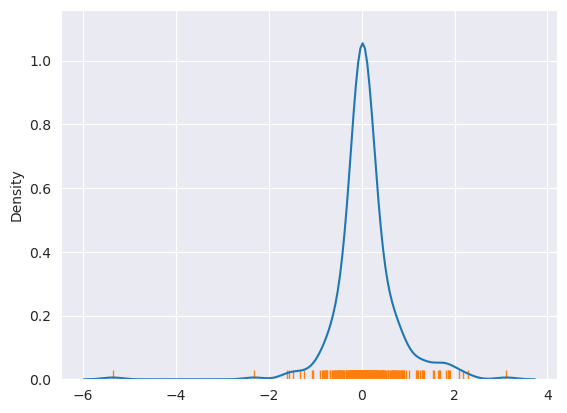

In [76]:
# Draw KDE line
ax = seaborn.kdeplot(lisa.Is)
# Add one small bar (rug) for each observation
# along horizontal axis
seaborn.rugplot(lisa.Is, ax=ax);

Figura - Patrones de clusterización local - Subsidios

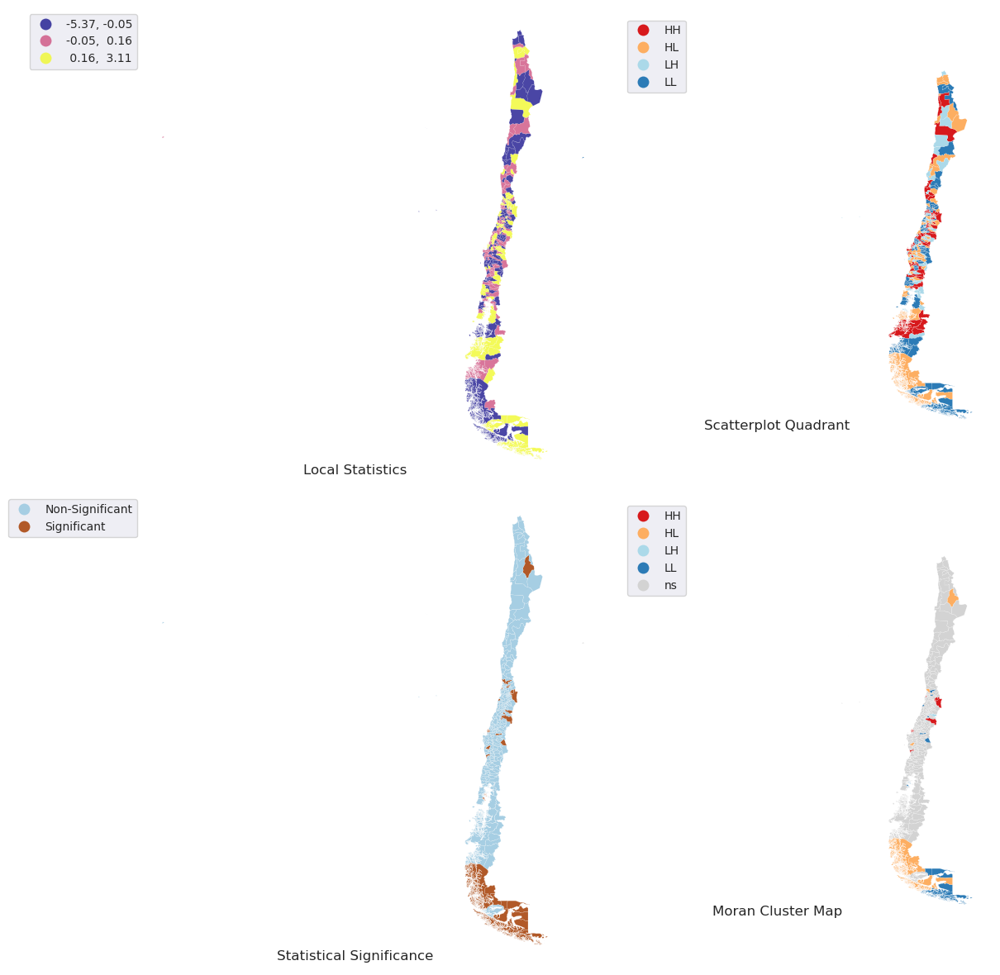

In [37]:
# Set up figure and axes
f, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))
# Make the axes accessible with single indexing
axs = axs.flatten()

# Subplot 1 #
# Choropleth of local statistics
# Grab first axis in the figure
ax = axs[0]
# Assign new column with local statistics on-the-fly
im = gdf.assign(
    Is=lisa.Is
    # Plot choropleth of local statistics
).plot(
    column="Is",
    cmap="plasma",
    scheme="quantiles",
    k=3,
    edgecolor="white",
    linewidth=0.1,
    alpha=0.75,
    legend=True,
    ax=ax,
)
legend = im.get_legend()
legend.set_bbox_to_anchor((0.0, 1.0))

# Subplot 2 #
# Quadrant categories
# Grab second axis of local statistics
ax = axs[1]
# Plot Quandrant colors (note to ensure all polygons are assigned a
# quadrant, we "trick" the function by setting significance level to
# 1 so all observations are treated as "significant" and thus assigned
# a quadrant color
esdaplot.lisa_cluster(lisa, gdf, p=1, ax=ax)
# Get the legend object
legend = ax.get_legend()
# Set the position of the legend
legend.set_bbox_to_anchor((0.3,1.1))

# Subplot 3 #
# Significance map
# Grab third axis of local statistics
ax = axs[2]
#
# Find out significant observations
labels = pd.Series(
    1 * (lisa.p_sim < 0.05),  # Assign 1 if significant, 0 otherwise
    index=gdf.index  # Use the index in the original data
    # Recode 1 to "Significant and 0 to "Non-significant"
).map({1: "Significant", 0: "Non-Significant"})
# Assign labels to `gdf` on the fly
im2 = gdf.assign(
    cl=labels
    # Plot choropleth of (non-)significant areas
).plot(
    column="cl",
    categorical=True,
    k=2,
    cmap="Paired",
    linewidth=0.1,
    edgecolor="white",
    legend=True,
    ax=ax,
)
legend = im2.get_legend()
legend.set_bbox_to_anchor((0.0, 1.0))

# Subplot 4 #
# Cluster map
# Grab second axis of local statistics
ax = axs[3]
# Plot Quandrant colors In this case, we use a 5% significance
# level to select polygons as part of statistically significant
# clusters
esdaplot.lisa_cluster(lisa, gdf, p=0.05, ax=ax)
# Get the legend object
legend = ax.get_legend()
# Set the position of the legend
legend.set_bbox_to_anchor((0.3,1.1))

# Figure styling #
# Set title to each subplot
for i, ax in enumerate(axs.flatten()):
    ax.set_axis_off()
    ax.set_title(
        [
            "Local Statistics",
            "Scatterplot Quadrant",
            "Statistical Significance",
            "Moran Cluster Map",
        ][i],
        y=0,
    )
# Tight layout to minimise in-betwee white space
f.tight_layout()

# Display the figure
plt.show()

In [38]:
lisa.q[:10]

array([4, 2, 3, 3, 2, 2, 1, 2, 3, 2])

Número de observaciones en cada cuadrante para la variable subsidios:

In [77]:
counts = pd.value_counts(lisa.q)
counts

3    100
1     98
2     80
4     67
dtype: int64

El mapa de clústeres indica que sólo una pequeña parte de los polígonos, el 14%, que presentan grados de autocorrelación espacial son lo suficientemente fuertes como para rechazar la ausencia de aleatoriedad espacial. Lo que significa que solo el 14% de las ciudades analizadas se consideran parte de un clúster espacial.

Local Moran's I para la variable Subsidos

In [78]:
(lisa.p_sim < 0.05).sum() * 100 / len(lisa.p_sim)

14.492753623188406

In [79]:
# Assign pseudo P-values to `db`
gdf["p-sim"] = lisa.p_sim
# `1` if significant (at 5% confidence level), `0` otherwise
sig = 1 * (lisa.p_sim < 0.05)
# Assign significance flag to `db`
gdf["sig"] = sig
# Print top of the table to inspect
gdf[["sig", "p-sim"]].head()

,sig,p-sim
0,0,0.426
1,0,0.214
2,0,0.175
3,0,0.184
4,0,0.141


In [80]:
# Print bottom of the table to inspect
gdf[["sig", "p-sim"]].tail()

,sig,p-sim
340,0,0.351
341,0,0.488
342,1,0.028
343,0,0.297
344,0,0.149


In [81]:
# Pick as part of a quadrant only significant polygons,
# assign `0` otherwise (Non-significant polygons)
spots = lisa.q * sig
# Mapping from value to name (as a dict)
spots_labels = {
    0: "Non-Significant",
    1: "HH",
    2: "LH",
    3: "LL",
    4: "HL",
}
# Create column in `db` with labels for each polygon
gdf["labels"] = pd.Series(
    # First initialise a Series using values and `db` index
    spots,
    index=gdf.index
    # Then map each value to corresponding label based
    # on the `spots_labels` mapping
).map(spots_labels)
# Print top for inspection
gdf["labels"].head()

0    Non-Significant
1    Non-Significant
2    Non-Significant
3    Non-Significant
4    Non-Significant
Name: labels, dtype: object

In [82]:
gdf["labels"].value_counts()

Non-Significant    295
HH                  19
LL                  19
HL                  11
LH                   1
Name: labels, dtype: int64

Desde una perspectiva global, hay presencia de una correlación espacial para ambas variables, las ventas de las empresas más pequeñas y los subsidios de Sercotec, sin embargo, a nivel local, el proceso es débil, sin patrones de agrupación marcados.

Finalmente, los siguientes mapas resumen los hallazgos de autocorrelación espacial global y local para cada variable, desde un punto de vista agregado.


In [83]:
myLIST1 = ['asdf_id', 'adm3', 'adm1', 'adm1-adm3', 'rank_sales', INDICATOR1]
df_MORAN1 = gdf[myLIST1]
df_MORAN1["WxINDICATOR21"] = weights.lag_spatial(W, df_MORAN1.iloc[: , -1])

In [84]:
globalMoran = Moran(gdf[INDICATOR1], W)
MoranI = globalMoran.I
MoranI = "{:.2f}".format(MoranI)
localMoran = Moran_Local(gdf[INDICATOR1], W, permutations = 999, seed=12345)

Figura - Patrones globales y locales de clusterización - Ventas

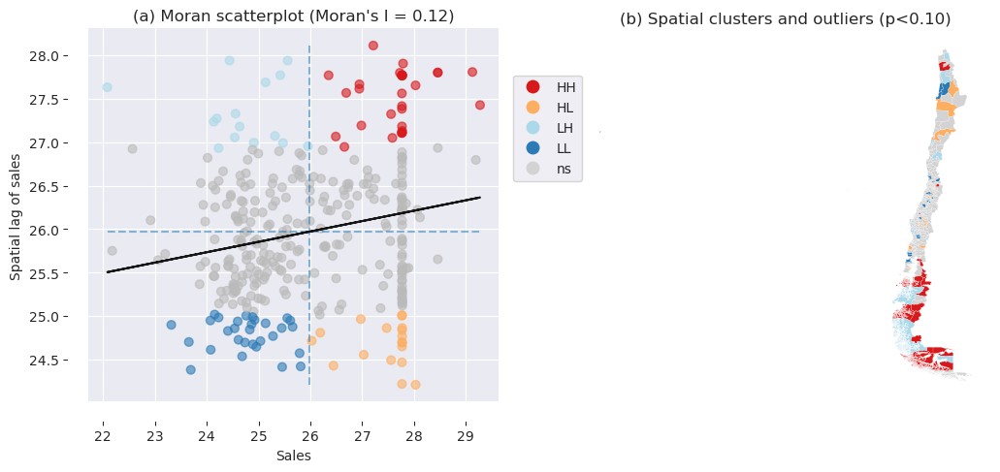

In [85]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,5))
moran_scatterplot(localMoran, p=0.10, aspect_equal=False, zstandard = False, ax=axes[0])
lisa_cluster(localMoran, gdf, p=0.10, legend_kwds={'bbox_to_anchor':(0.02, 0.90)},  ax=axes[1])
#cx.add_basemap(axes[1], crs=gdf.crs.to_string(), source=cx.providers.Stamen.TonerLite, attribution=False)
#cx.add_basemap(axes[1], crs=gdf.crs.to_string(), source=cx.providers.Stamen.TonerLabels, attribution=False)
axes[0].set_xlabel('Sales')
axes[0].set_ylabel('Spatial lag of sales')
axes[0].set_title(f"(a) Moran scatterplot (Moran's I = {MoranI})")
axes[1].set_title("(b) Spatial clusters and outliers (p<0.10)")
plt.show()

In [86]:
myLIST2 = ['asdf_id', 'adm3', 'adm1', 'adm1-adm3', 'rank_sercotec', INDICATOR2]
df_MORAN2 = gdf[myLIST2]
df_MORAN2["WxINDICATOR2"] = weights.lag_spatial(W, df_MORAN2.iloc[: , -1])

In [87]:
globalMoran = Moran(gdf[INDICATOR2], W)
MoranI = globalMoran.I
MoranI = "{:.2f}".format(MoranI)
localMoran = Moran_Local(gdf[INDICATOR2], W, permutations = 999, seed=12345)

Figura - Patrones globales y locales de clusterización - Subsidios

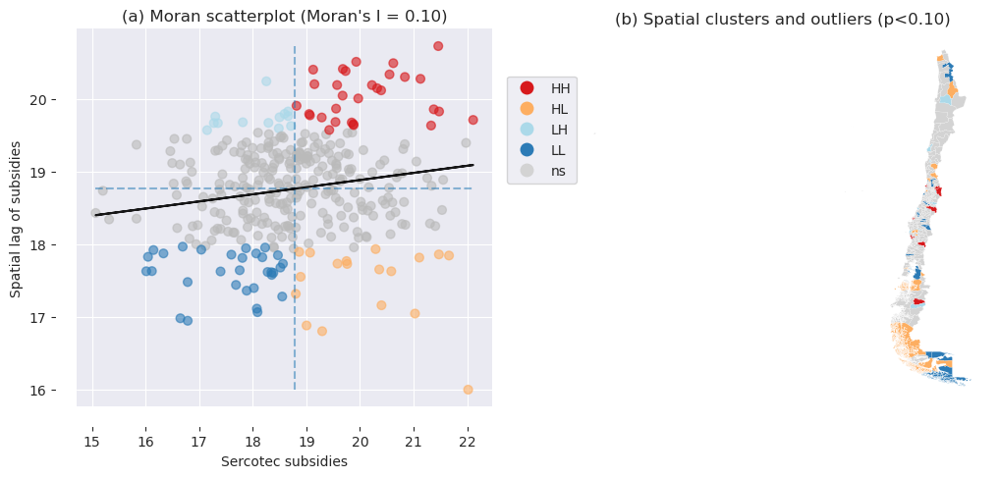

In [88]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,5))
moran_scatterplot(localMoran, p=0.10, aspect_equal=False, zstandard = False, ax=axes[0])
lisa_cluster(localMoran, gdf, p=0.10, legend_kwds={'bbox_to_anchor':(0.02, 0.90)},  ax=axes[1])
#cx.add_basemap(axes[1], crs=gdf.crs.to_string(), source=cx.providers.Stamen.TonerLite, attribution=False)
#cx.add_basemap(axes[1], crs=gdf.crs.to_string(), source=cx.providers.Stamen.TonerLabels, attribution=False)
axes[0].set_xlabel('Sercotec subsidies')
axes[0].set_ylabel('Spatial lag of subsidies')
axes[0].set_title(f"(a) Moran scatterplot (Moran's I = {MoranI})")
axes[1].set_title("(b) Spatial clusters and outliers (p<0.10)")
plt.show()

## 5. Heterogeneidad espacial de los efectos de subsidios Sercotec en ventas de micro y pequeñas empresas 

En este análisis, se utilizó una regresión ponderada geográficamente (GWR) para examinar la heterogeneidad de los efectos de los subsidios públicos otorgados por el Servicio de Cooperación Técnica a las micro y pequeñas empresas en 2021 en Chile a nivel de ciudad. Al considerar las relaciones locales entre los subsidios y las micro y pequeñas empresas, GWR brinda una comprensión más matizada de la relación entre estas variables, más allá de lo que sería posible con los modelos de regresión tradicionales, tales como mínimos cuadrados ordinarios (OLS).

Comenzamos definiendo nuestro modelo de especificación. En este trabajo, se utilizó un modelo simple de dos variables:

$$
Y = \alpha + \beta X + \epsilon
$$

Donde $Y$ representa la variable dependiente o las ventas de las micro y pequeñas empresas expresadas en logaritmo natural, $\alpha$ es la constante, $\beta$ es el coeficiente en el que los subsidios afectan las ventas, $X$ es el logaritmo natural de los Subsidios que otorga Sercotec a este segmento y $\epsilon$ es el error.

A partir de esto se realizó una regresión OLS para verificar los efectos globales del modelo. Los resultados resumidos se pueden ver en la siguiente tabla:


Tabla - Resultados regresión OLS

In [51]:
import statsmodels.api as sm

# Define the dependent variable (y) and independent variable (X)
y = gdf['sales']
X = gdf[['sercotec']]

# Add a constant to the independent variable for the intercept
X = sm.add_constant(X)

# Fit the OLS regression model
model = sm.OLS(y, X).fit()

# Print the summary of the model
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.027
Model:                            OLS   Adj. R-squared:                  0.025
Method:                 Least Squares   F-statistic:                     9.689
Date:                Tue, 28 Feb 2023   Prob (F-statistic):            0.00201
Time:                        07:12:23   Log-Likelihood:                -609.29
No. Observations:                 345   AIC:                             1223.
Df Residuals:                     343   BIC:                             1230.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         22.5284      1.111     20.276      0.0

In [52]:
y = gdf[INDICATOR1].values.reshape((-1,1))
x = gdf[INDICATOR2].values.reshape((-1,1))
#new
#x1 = gdf[['firms', 'lntotalwagefem', 'lntotalwagemale', 'LTL2020pc']].values
#x1.shape

In [53]:
u = gdf['COORD_X']
v = gdf['COORD_Y']
coords = list(zip(u,v))

In [54]:
gwr_selector = Sel_BW(coords, y, x, spherical = True)
#gwr_selector = Sel_BW(coords, y, x1, spherical = True)
gwr_bw = gwr_selector.search(criterion='AICc')

In [55]:
print('GWR bandwidth =', gwr_bw)

GWR bandwidth = 89.0


Considerando que el objetivo de este modelo es mostrar en qué medida aumentarían las Ventas de mipes, dado el aumento de 1 unidad de Subsidios,  se puede observar un efecto positivo. 

El coeficiente de la variable subsidios indica que por una unidad de aumento en los subsidios, podemos esperar un aumento de 0.184 unidades en las ventas de las micro y pequeñas empresas desde un punto de vista espacial global, manteniendo todas las demás variables constantes. Sin embargo, el modelo explica el 2,7% de la variabilidad en las ventas de las micro y pequeñas empresas en 2021.

Los valores encontrados en la literatura no están muy lejos de este hallazgo. Por ejemplo, el artículo publicado por Bergström (1998) sobre subsidios de capital en la Unión Europea encontró que durante un año (1989-90) el coeficiente de subsidios fue de 0,29 y el r-cuadrado de 0,15. En todo caso, esta publicación consideró tanto a las empresas subsidiadas como a las no subsidiadas en su especificación, variables independientes adicionales como el stock de capital y el trabajo, además de análisis de panel.

A partir de la comprensión de la heterogeneidad espacial a nivel local, se utilizó una especificación de regresión ponderada geográficamente (GWR) simple.

$$
Y_j = \alpha_j + \beta_j X_j + \epsilon_j
$$

Donde $Y_j$ son las ventas de las micro y pequeñas empresas expresadas en logaritmo natural en la ciudad $_j$, $\alpha_j$ es el intercepto de la ciudad $_j$, $\beta_j$ es el coeficiente de $X$ en la ciudad $_j$, $X_j$ es el logaritmo natural de los Subsidios otorgados por Sercotec a este segmento en la ciudad $_j$, y $\epsilon$ es el término de error para la ciudad $_j$.

Esto significa que el modelo se aplicó a cada unidad de observación, en este caso ciudades, mediante la calibración de un ancho de banda.


Tabla - Resultados Regresión Geográficamente Ponderada

In [56]:
gwr_results = GWR(coords, y, x, gwr_bw).fit()
gwr_results.summary()

Model type                                                         Gaussian
Number of observations:                                                 345
Number of covariates:                                                     2

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                            690.745
Log-likelihood:                                                    -609.288
AIC:                                                               1222.575
AICc:                                                              1224.646
BIC:                                                              -1313.591
R2:                                                                   0.027
Adj. R2:                                                              0.025

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [57]:
# As reference, here is the (mean) R2, AIC, and AICc
print('Mean R2 =', gwr_results.R2)
print('AIC =',     gwr_results.aic)
print('AICc =',    gwr_results.aicc)

Mean R2 = 0.2870033848684058
AIC = 1158.984580271664
AICc = 1162.6563696405387


Estos resultados sugieren que la relación entre los subsidios otorgados por Sercotec y las ventas de las micro y pequeñas empresas tiene impactos diferentes en diferentes lugares de Chile y que el análisis GWR brinda una mejor explicación de la heterogeneidad espacial de esta relación en comparación con el análisis de regresión global.

Comparado con su contraparte global, el modelo GWR explica mucho más la variabilidad con un valor de R cuadrado del 27% y con resultados estadísticamente significativos. Esto significa que el modelo GWR puede capturar mejor la heterogeneidad espacial en la relación entre la respuesta y las variables predictoras.

En el siguiente mapa es posible explorar el patrón espacial de la bondad de ajuste del modelo de regresión ponderado geográficamente (GWR). Al hacer zoom en el mapa se podrá observar qué ciudades cuentas con valores estadísticamente significativos (rojos).


In [58]:
# Add R2 to GeoDataframe 
gdf['gwr_R2'] = gwr_results.localR2

Figure - Heterogeneidad espacial de los efectos de subsidios en ventas de mipes (mapa interactivo)

In [59]:
# Local R2
gdf.explore(
    column= 'gwr_R2',
    tooltip=['adm1', 'adm3', 'gwr_R2', 'rank_sales', INDICATOR1, INDICATOR2],
    k = 5,
    scheme='FisherJenks',
    cmap='coolwarm',
    legend=True,
    tiles= 'CartoDB dark_matter',
    style_kwds =dict(color="gray", weight=0.4),
    legend_kwds=dict(colorbar=False)
)

In [60]:
# Add coefficients to data frame
gdf['gwr_intercept'] = gwr_results.params[:,0]
gdf['gwr_slope']     = gwr_results.params[:,1]

In [61]:
# Filter t-values: standard alpha = 0.05
gwr_filtered_t = gwr_results.filter_tvals(alpha = 0.05)

In [62]:
# Filter t-values: corrected alpha due to multiple testing
gwr_filtered_tc = gwr_results.filter_tvals()

A su vez, un ancho de banda de 89 observaciones en un tamaño de muestra de 345 ciudades sugiere un ancho de banda relativamente alto, lo que implica un sobreajuste y pérdida de información (sesgo) de dependencia espacial. Esto puede ser respaldado por el alto valor de AIC. Estos sugieren que otros enfoques y más datos podrían ser adecuados para tener un mejor ajuste y resultados más sólidos.

Con respecto al ajuste del modelo GWR, la siguiente colección de mapas nos permite profundizar en la importancia de los resultados.

Text(0.5, 1.0, '(c) GWR: Sercotec subsidies (BW: 89.0), significant coeffs and corr. p-values')

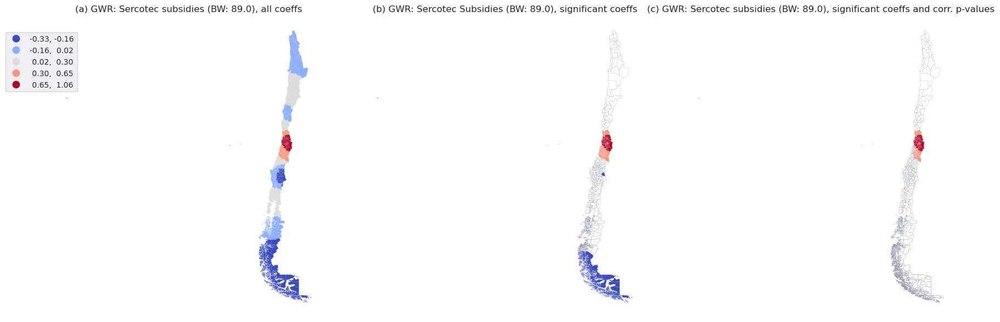

In [63]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18,6))

gdf.plot(column='gwr_slope', cmap = 'coolwarm', linewidth=0.01, scheme = 'FisherJenks', k=5, legend=True, legend_kwds={'bbox_to_anchor':(0.10, 0.96)},  ax=axes[0])

gdf.plot(column='gwr_slope', cmap = 'coolwarm', linewidth=0.05, scheme = 'FisherJenks', k=5, legend=False, legend_kwds={'bbox_to_anchor':(1.10, 0.96)},  ax=axes[1])
gdf[gwr_filtered_t[:,1] == 0].plot(color='white', linewidth=0.05, edgecolor='black', ax=axes[1])


gdf.plot(column='gwr_slope', cmap = 'coolwarm', linewidth=0.05, scheme = 'FisherJenks', k=5, legend=False, legend_kwds={'bbox_to_anchor':(1.10, 0.96)},  ax=axes[2])
gdf[gwr_filtered_tc[:,1] == 0].plot(color='white', linewidth=0.05, edgecolor='black', ax=axes[2])

plt.tight_layout()

axes[0].axis("off")
axes[1].axis("off")
axes[2].axis("off")

axes[0].set_title('(a) GWR: Sercotec subsidies (BW: ' + str(gwr_bw) +'), all coeffs', fontsize=12)
axes[1].set_title('(b) GWR: Sercotec Subsidies (BW: ' + str(gwr_bw) +'), significant coeffs',     fontsize=12)
axes[2].set_title('(c) GWR: Sercotec subsidies (BW: ' + str(gwr_bw) +'), significant coeffs and corr. p-values',     fontsize=12)
#plt.show()

In [64]:
fig.savefig('maps.png', dpi=300, bbox_inches='tight')

El mapa de la izquierda muestra las pendientes locales de todos los coeficientes, para cada uno de las ciudades, sin restricciones ni filtros. El mapa del medio muestra las pendientes locales sólo para los coeficientes significativos o aquellos coeficientes con un valor de p inferior a 0,05. Las áreas donde los coeficientes no son significativos se representan en blanco. El mapa de la derecha muestra las pendientes locales para los coeficientes significativos y los que tienen un valor de p de correlación bajo. Como se ve, a través de la utilización de estos datos se muestran pocas ciudades estadísticamente significativas.

Un dato interesante es que los valores más significativos del mapa corresponden a la Región Metropolitana y su vecina inmediata, la Región de Valparaíso. Además, se pueden observar efectos indirectos, ya que las ciudades del sur de la Región de Coquimbo y del norte de la Región de O’Higgins también presentan valores estadísticamente significativos. Esto significa que existe una relación significativa entre estas cuatro regiones y algunas de sus ciudades.


In [101]:
gwr_results

Tabla - Coeficientes del efecto de subsidios y p-values por cada ciudad de Chile.

P-values inferiores a 0.005 son estadísticamente significativos. En la tabla interactiva aparecen en orden ascendente, es decir, la tabla muestra primero los valores estadísticamente significativos.

In [121]:
# Extract the GWR coefficients for each city
coefficients = gwr_results.params[:, 1] # extract the coefficients for the x variable (sercotec)

# Calculate the standard errors for each coefficient
se = gwr_results.bse[:, 1]

# Calculate the t-values for each coefficient
tvalues = coefficients / se

# Calculate the p-values for each coefficient using a two-tailed t-test
pvalues = 2 * (1 - stats.t.cdf(abs(tvalues), gwr_results.df_resid))
 
#Extract name of regions
region_names = gdf['adm1'].values

# Extract the names of the cities
city_names = gdf['adm3'].values 



# Compile the coefficients, p-values, and city names into a table
results_table = pd.DataFrame({'Region': region_names, 'Ciudad': city_names, 'Coeficiente': coefficients, 'P-value': pvalues})
#results_table.sort
results_table_sorted = results_table.sort_values(by='P-value', ascending=True)

# Display the sorted results table
display(results_table_sorted)

,Region,Ciudad,Coeficiente,P-value
320,Metropolitana,Tiltil,0.856519,1.103384e-11
111,Metropolitana,Lampa,0.887173,2.676614e-11
126,Metropolitana,Curacavi,0.889794,3.259926e-11
68,Valparaiso,Olmue,0.821234,7.202239e-11
108,Metropolitana,Colina,0.876756,8.573009e-11
...,...,...,...,...
228,Antofagasta,Mejillones,-0.002656,9.831039e-01
239,Antofagasta,Sierra Gorda,-0.002369,9.850230e-01
150,Aysen,Cisnes,0.001763,9.901706e-01
123,Nuble,Quillon,-0.001690,9.904440e-01


## Referencias

- Maribel, G., & Serey, T. (2021). Global Entrepreneurship Monitor - Reporte Nacional 2021. Global Entrepreneurship Monitor and Universidad del Desarrollo.
- OECD. (2021). Government at a Glance 2021. OECD Publishing, Paris.
- Indusrtrial and Comercial Policy Division, Ministry of Economy of Chile. (2021). Análisis descriptivo del impacto de la pandemia sobre las empresas en Chile. Ministry of Economy of Chile.
- World Bank. (2022). Diálogos Territoriales de Futuro. World Bank.
- Rey, S., Arribas-Bel, D., & Wolf, L. (2021). Geographic Data Science with Python. Chapman and Hall/CRC.
- Karahasan, B. C. (2018). Spatial Varying Relationship between Financial Development and New Firm Formation: Evidence from a Developing Country. Panoeconomicus, 633-675.
- Prakoso, J. A., Giovanni, A., & Panjawa, J. L. (2021). Spatial Patterns, Opportunities and Determinants of MSMEs Employment in Township. JEJAK.
- Gálvez-Gamboa, F. A., Muñoz-Henríquez, E. M., & Valenzuela-Keller, A. (2023). Heterogeneidad en el impacto del Covid-19 sobre las ventas de microempresas en Chile a nivel municipal. Anales de Geografía de la Universidad Complutense.
- Iman, Q., & Pasaribu, E. (2022). Entrepreneurial Development in the Indonesian Economy: Spatial Heterogeneity Analysis of E-Commerce Implementation Determinants by MSMEs During the COVID-19 Pandemic. JOURNAL OF RESILIENT ECONOMIES.
- Cravo, T. (2010). Regional Economic Growth and SMEs in Brazil: a Spatial Analysis. 50th Congress of the European Regional Science Association: "Sustainable Regional Growth and Development in the Creative Knowledge Economy", 19-23.
- Contreras, S., & Rupasingha, A. (2014). Factors Affecting Spatial Variation of Microenterprises in the Rural United States. American Journal of Entrepreneurship, 17-31.
- Contreras, S. (2019). One Size Does Not Fit All: Evaluating the Relationship Between Microenterprise Measurement and Policy Evaluation. Social Science Research Network.
- Bergström, F. (1998). Capital Subsidies and the Performance of Firms. Small Business Economics.
- Brundson, C. (1998). Geographically weighted regression modelling spatial non stationarity. Journal of the Royal Statistical Society.
- Anselin, L. (1998). Spatial Econometrics: Methods and Models. Springer Dordrecht.
- Sachdeva, M., & Fotheringham, S. (2022). The Geographically Weighted Regression Framework. The Geographic Information Science & Technology Body of Knowledge (4th Quarter 2020 Edition).



<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=98f14083-5ffd-4b03-8b72-0d1f63cde6d6' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>